<a href="https://colab.research.google.com/github/codewithdebuu/Data-Science-and-Machine-Learning-Projects/blob/main/Copy_of_House_Prices_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Data Manipulation Libraries
import pandas as pd

# Data Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

# Machine Learning Libraries
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dataset/House Prices Prediction_test.csv")
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
print("Shape:")
print(df.shape)
print()
print("Info:")
print(df.info())
print()
print("NaN Values:")
print(df.isnull().sum())
print()
print("NaN Values as Percentage:")
print((df.isnull().sum()/len(df))*100)
print()
print("Duplicates Values:")
print(df.duplicated().sum())
print()

Shape:
(1460, 81)

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-nul

## Display all columns that contain any NaN values.

In [ ]:
print("NaN Values as Percentage (with Datatypes):")

records = []   # list to store rows

for col in df.columns:
    pct = (df[col].isnull().sum() / len(df)) * 100
    if pct > 0:   # only include columns with missing values
        records.append([col, pct, df[col].dtype])

# Convert list → DataFrame
nan_df = pd.DataFrame(records, columns=["Column", "NaN_Percentage", "DataType"])

nan_df


NaN Values as Percentage (with Datatypes):


,Column,NaN_Percentage,DataType
0,LotFrontage,17.739726,float64
1,Alley,93.767123,object
2,MasVnrType,59.726027,object
3,MasVnrArea,0.547945,float64
4,BsmtQual,2.534247,object
5,BsmtCond,2.534247,object
6,BsmtExposure,2.602740,object
7,BsmtFinType1,2.534247,object
8,BsmtFinType2,2.602740,object
9,Electrical,0.068493,object


## Remove columns with 40% or more NaN values.

In [ ]:
print("Shape before dropping columns:")
print(df.shape)
print()

for col in df.columns:
  if ((df[col].isnull().sum()/len(df))*100) > 40:
    df.drop(columns=[col], inplace=True)

print("Shape after dropping columns:")
print(df.shape)
print()

Shape before dropping columns:
(1460, 81)

Shape after dropping columns:
(1460, 75)



## Display all columns that contain any NaN values.

In [ ]:
print("NaN Values as Percentage (with Datatypes):")

records = []   # list to store rows

for col in df.columns:
    pct = (df[col].isnull().sum() / len(df)) * 100
    if pct > 0:   # only include columns with missing values
        records.append([col, pct, df[col].dtype])

# Convert list → DataFrame
nan_df = pd.DataFrame(records, columns=["Column", "NaN_Percentage", "DataType"])

nan_df


NaN Values as Percentage (with Datatypes):


,Column,NaN_Percentage,DataType
0,LotFrontage,17.739726,float64
1,MasVnrArea,0.547945,float64
2,BsmtQual,2.534247,object
3,BsmtCond,2.534247,object
4,BsmtExposure,2.602740,object
5,BsmtFinType1,2.534247,object
6,BsmtFinType2,2.602740,object
7,Electrical,0.068493,object
8,GarageType,5.547945,object
9,GarageYrBlt,5.547945,float64


## Fill numaric & categorical columns Using For Loop

In [ ]:
# Fill numeric columns
for col in df.select_dtypes(include=['int64','float64']):
    df[col] = df[col].fillna(df[col].median())

# Fill categorical columns
for col in df.select_dtypes(include='object'):
    df[col] = df[col].fillna(df[col].mode()[0])

print("Successfully completed.")


Successfully completed. 


In [ ]:
print("NaN Values as Percentage (with Datatypes):")

records = []   # list to store rows

for col in df.columns:
    pct = (df[col].isnull().sum() / len(df)) * 100
    if pct > 0:   # only include columns with missing values
        records.append([col, pct, df[col].dtype])

# Convert list → DataFrame
nan_df = pd.DataFrame(records, columns=["Column", "NaN_Percentage", "DataType"])

nan_df


NaN Values as Percentage (with Datatypes):


,Column,NaN_Percentage,DataType


# Boxplot

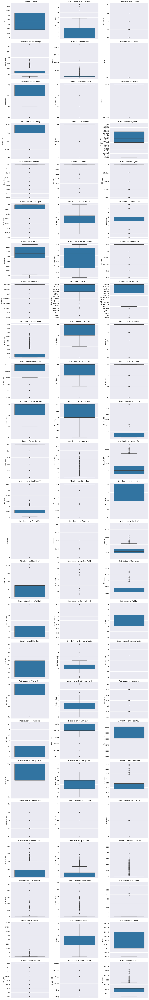

In [ ]:
import math

# Number of charts per row
n_cols = 3

# Calculate required number of rows
n_rows = math.ceil(len(df.columns) / n_cols)

# Create subplots grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()

# Plot each column on its subplot
for i, col in enumerate(df.columns):
    sns.boxplot(df[col], ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")

# Hide any unused axes (if columns not multiple of 3)
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# Remove Outlier

In [ ]:
from numpy._core.defchararray import lower
num_cols = df.select_dtypes(include=['int64','float64']).columns

for col in num_cols:
  Q1 = df[col].quantile(0.25)
  Q3 = df[col].quantile(0.75)
  IQR = Q3 - Q1

  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

print("Successfully completed.")

Successfully completed.


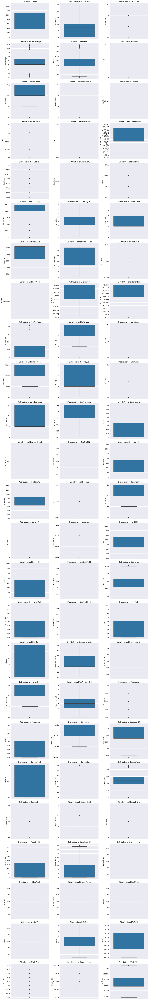

In [ ]:
# Number of charts per row
n_cols = 3

# Calculate required number of rows
n_rows = math.ceil(len(df.columns) / n_cols)

# Create subplots grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()

# Plot each column on its subplot
for i, col in enumerate(df.columns):
    sns.boxplot(df[col], ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")

# Hide any unused axes (if columns not multiple of 3)
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

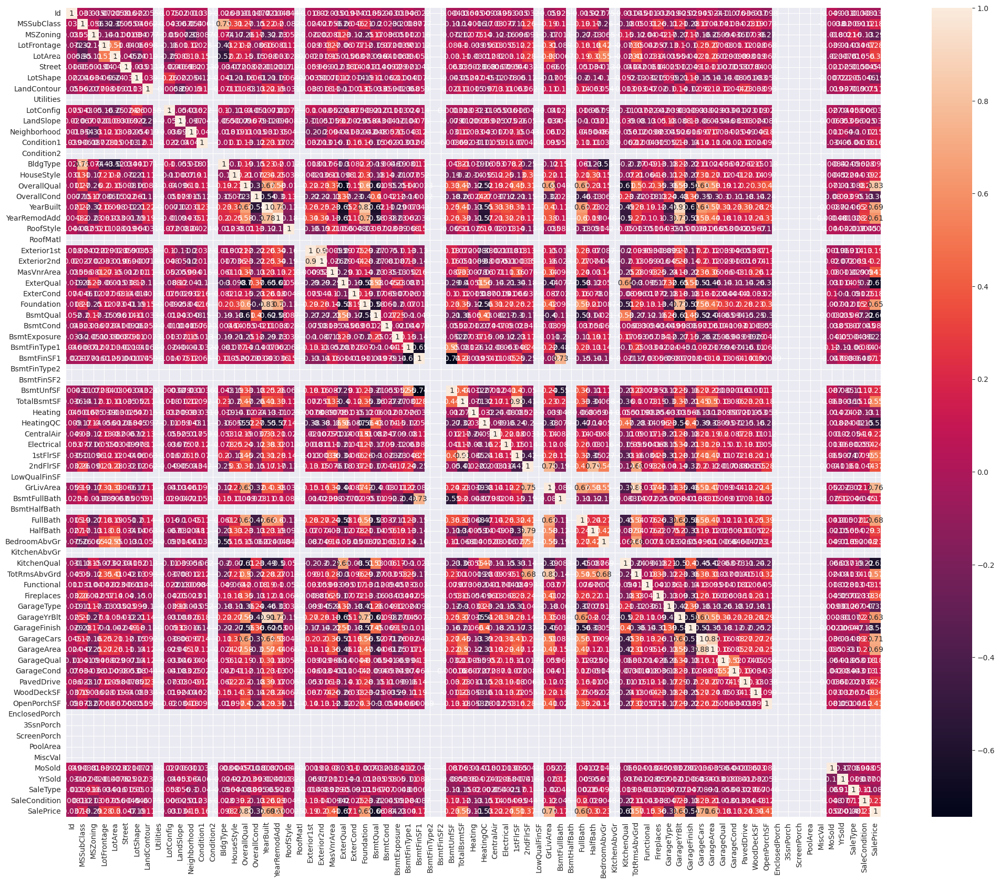

In [ ]:
plt.figure(figsize=(25,20))
sns.heatmap(df.corr(), annot=True)
plt.show()

# Lable Encoding

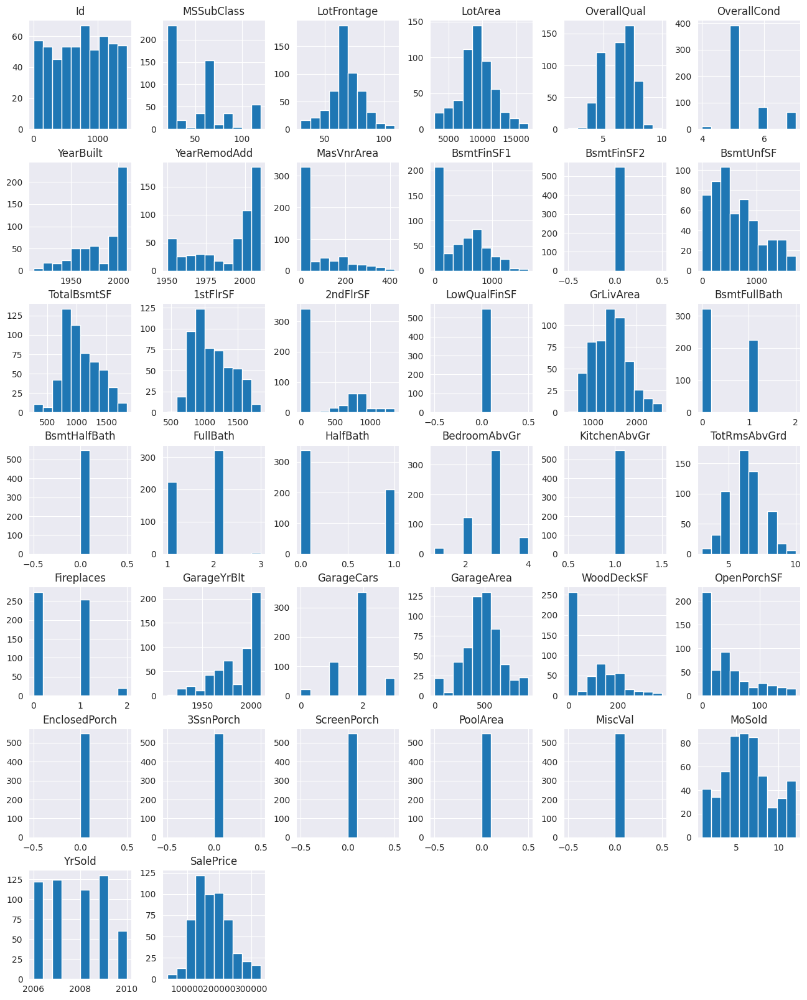

In [ ]:
# Only Numaric Datatype

df.hist(figsize=(16,20))
plt.show()

# All Datatype

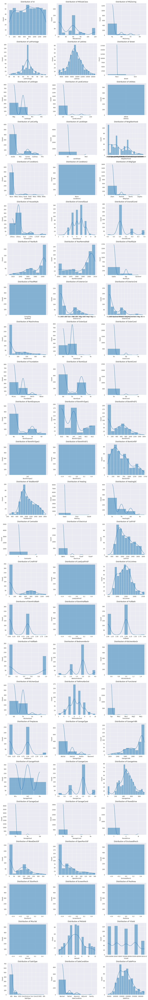

In [ ]:
import math

# Number of charts per row
n_cols = 3

# Calculate required number of rows
n_rows = math.ceil(len(df.columns) / n_cols)

# Create subplots grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()

# Plot each column on its subplot
for i, col in enumerate(df.columns):
    sns.histplot(df[col], ax=axes[i], kde=True)
    axes[i].set_title(f"Distribution of {col}")

# Hide any unused axes (if columns not multiple of 3)
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
le = LabelEncoder()
df_obj = df.select_dtypes(include=['object'])

df[df_obj.columns] = df_obj.apply(lambda col: le.fit_transform(col))

df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,2,65.0,8450,1,3,3,0,4,...,0,0,0,0,0,2,2008,8,3,208500
2,3,60,2,68.0,11250,1,0,3,0,4,...,0,0,0,0,0,9,2008,8,3,223500
4,5,60,2,84.0,14260,1,0,3,0,2,...,0,0,0,0,0,12,2008,8,3,250000
6,7,20,2,75.0,10084,1,3,3,0,4,...,0,0,0,0,0,8,2007,8,3,307000
10,11,20,2,70.0,11200,1,3,3,0,4,...,0,0,0,0,0,2,2008,8,3,129500


# Best Feature Selection

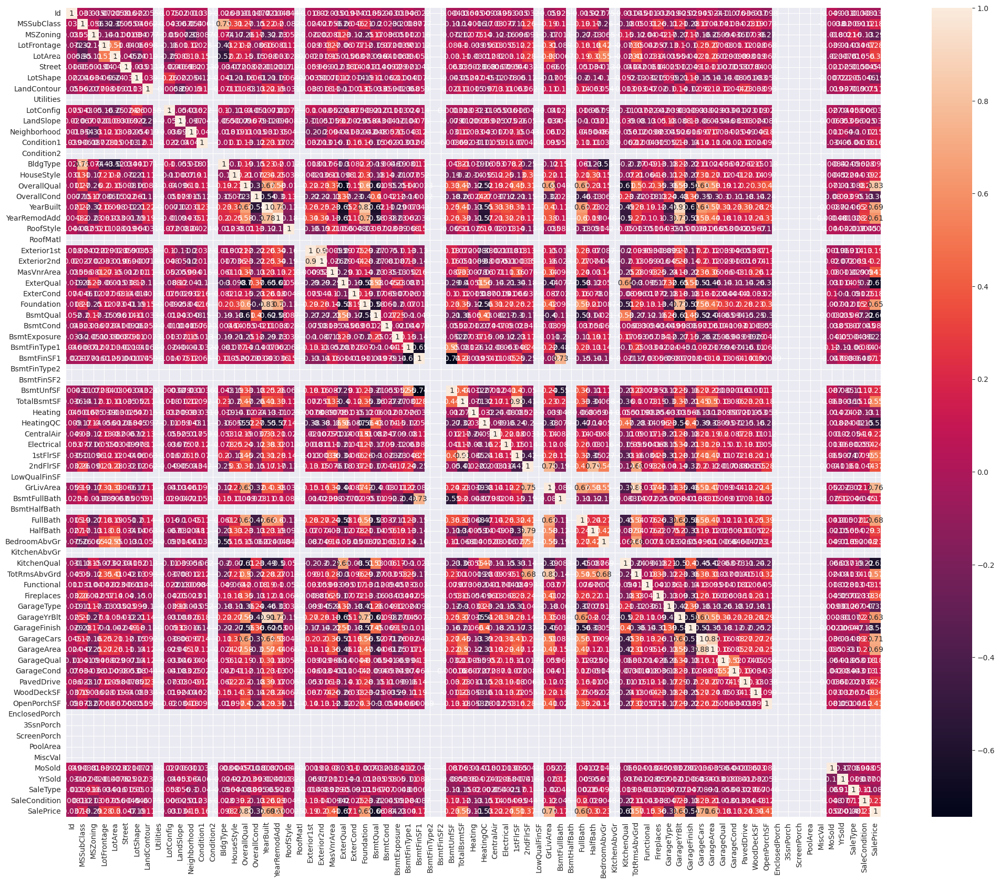

In [ ]:
plt.figure(figsize=(25,20))
sns.heatmap(df.corr(), annot=True)
plt.show()

In [ ]:
target = "SalePrice"
threshold = 0.30  # Terget percentage

# Full correlation (keeps positive/negative sign)
corr_full = df.corr()[target]

# Filter using absolute value but keep actual sign
selected = corr_full[corr_full.abs() >= threshold].sort_values(ascending=False)

# Create DataFrame
corr_df = selected.to_frame().reset_index()
corr_df.columns = ["Feature", "Correlation"]

# Add absolute percent correlation
corr_df["Correlation (%)"] = (corr_df["Correlation"].abs() * 100).round(2)

# Show result
print("\n Correlation with Positive/Negative Sign:\n")
print(corr_df)

# Print feature list only
print("\n Selected Feature Names:")
print(corr_df["Feature"].tolist())
print()



 Correlation with Positive/Negative Sign:

         Feature  Correlation  Correlation (%)
0      SalePrice     1.000000           100.00
1    OverallQual     0.834155            83.42
2      GrLivArea     0.758951            75.90
3     GarageCars     0.712544            71.25
4      YearBuilt     0.692705            69.27
5     GarageArea     0.688153            68.82
6       FullBath     0.680493            68.05
7     Foundation     0.648481            64.85
8    GarageYrBlt     0.632969            63.30
9   YearRemodAdd     0.612175            61.22
10  TotRmsAbvGrd     0.572121            57.21
11   TotalBsmtSF     0.554271            55.43
12      1stFlrSF     0.507753            50.78
13   OpenPorchSF     0.409521            40.95
14    MasVnrArea     0.407025            40.70
15      2ndFlrSF     0.365972            36.60
16    Fireplaces     0.356323            35.63
17    WoodDeckSF     0.338591            33.86
18       LotArea     0.302663            30.27
19      HalfBath

In [ ]:
df2 = df[['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'YearBuilt', 'GarageArea', 'FullBath', 'Foundation', 'GarageYrBlt', 'YearRemodAdd', 'TotRmsAbvGrd', 'TotalBsmtSF', '1stFlrSF', 'OpenPorchSF', 'MasVnrArea', '2ndFlrSF', 'Fireplaces', 'WoodDeckSF', 'LotArea', 'HalfBath', 'GarageType', 'OverallCond', 'HeatingQC', 'GarageFinish', 'KitchenQual', 'BsmtQual', 'ExterQual']
]

df2.head()

,SalePrice,OverallQual,GrLivArea,GarageCars,YearBuilt,GarageArea,FullBath,Foundation,GarageYrBlt,YearRemodAdd,...,WoodDeckSF,LotArea,HalfBath,GarageType,OverallCond,HeatingQC,GarageFinish,KitchenQual,BsmtQual,ExterQual
0,208500,7,1710,2,2003,548,2,2,2003.0,2003,...,0,8450,1,0,5,0,1,2,2,2
2,223500,7,1786,2,2001,608,2,2,2001.0,2002,...,0,11250,1,0,5,0,1,2,2,2
4,250000,8,2198,3,2000,836,2,2,2000.0,2000,...,192,14260,1,0,5,0,1,2,2,2
6,307000,8,1694,2,2004,636,2,2,2004.0,2005,...,255,10084,0,0,5,0,1,2,0,2
10,129500,5,1040,1,1965,384,1,1,1965.0,1965,...,0,11200,0,3,5,0,2,3,3,3


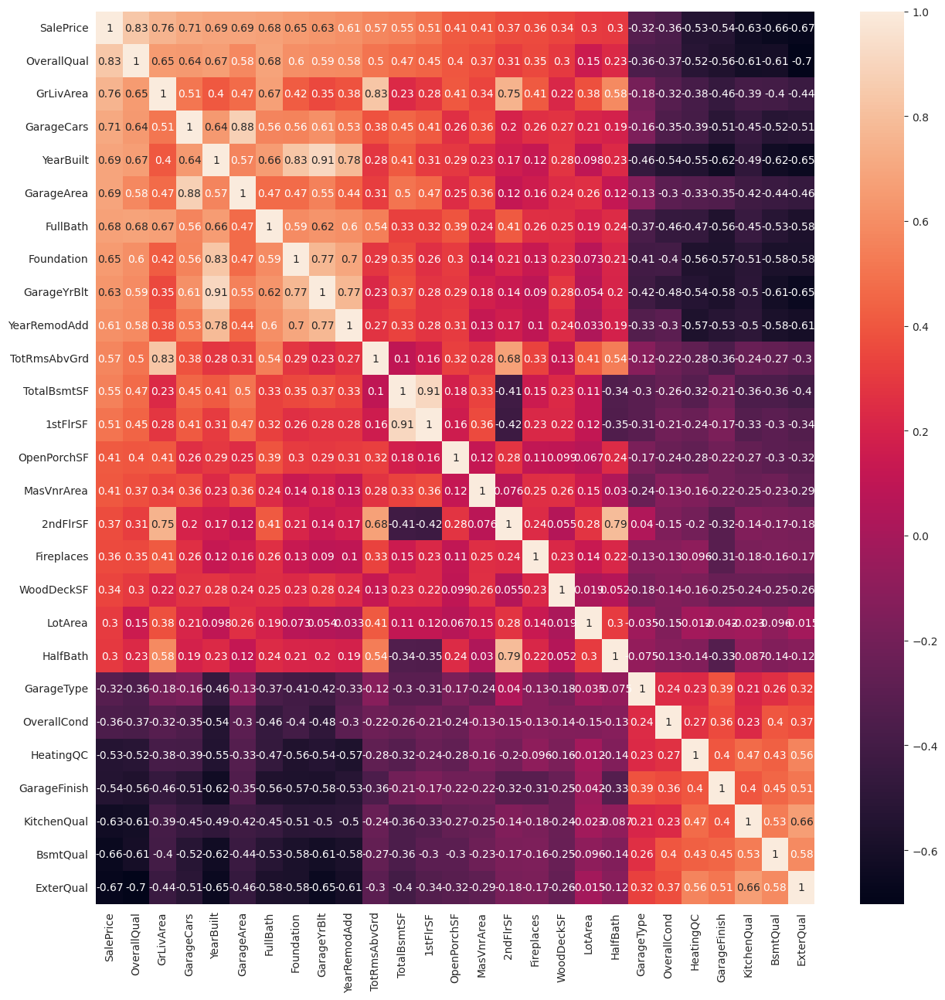

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(df2.corr(), annot=True)
plt.show()

# Feature Scaling

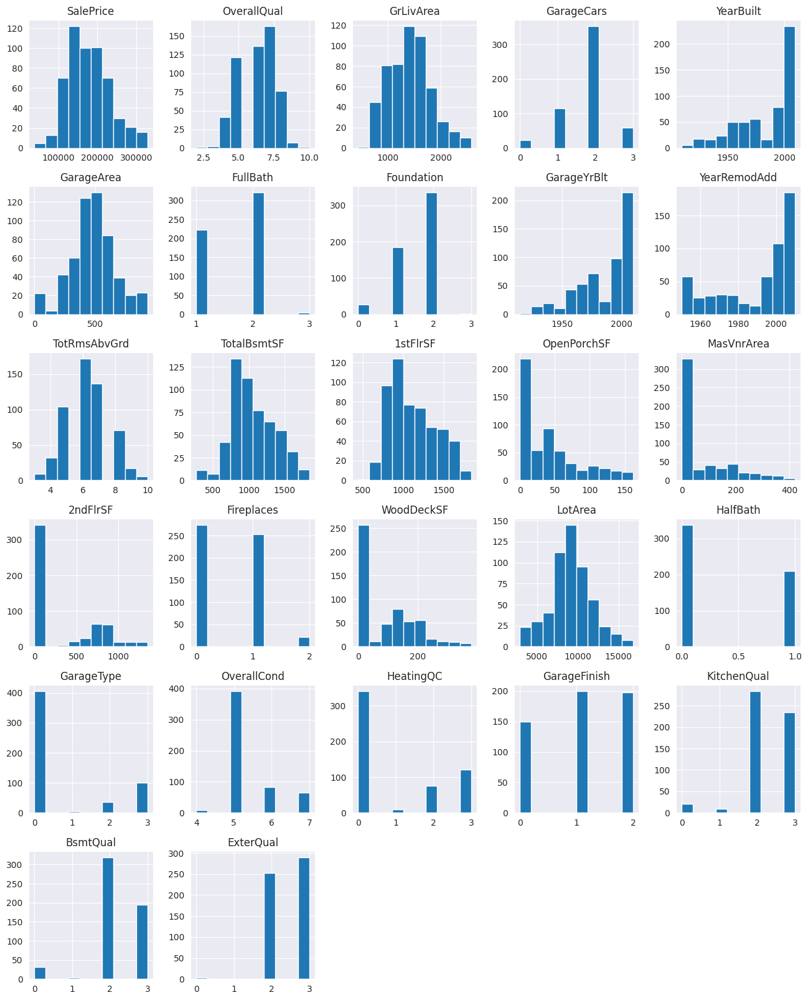

In [ ]:
df2.hist(figsize=(16,20))
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()

num_cols = df2.select_dtypes(include=['int64','float64']).columns

df2[num_cols] = df2[num_cols].apply(
    lambda col: pd.Series(
        ss.fit_transform(col.values.reshape(-1,1)).flatten()
    )
)

print("Successfully completed.")


Successfully completed.


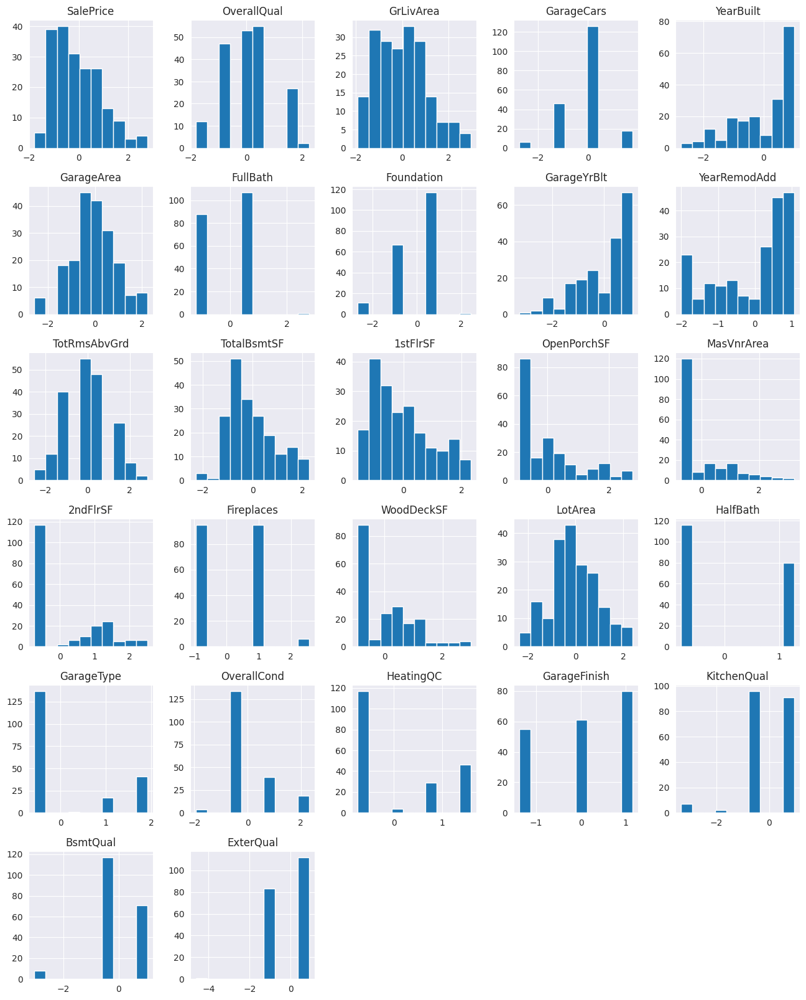

In [ ]:
df2.hist(figsize=(16,20))
plt.show()

# Best Model Selection


==================== MODEL PERFORMANCE (SIMPLE SCORE) ====================

Linear Regression: Score = 0.8639
Ridge Regression: Score = 0.8647
Lasso Regression: Score = 0.8640
ElasticNet: Score = 0.8543
Decision Tree: Score = 0.6331
Random Forest: Score = 0.8720
Extra Trees: Score = 0.8805
Gradient Boosting: Score = 0.8764
AdaBoost Regressor: Score = 0.8354
Bagging Regressor: Score = 0.8485
KNN Regressor: Score = 0.7402
SVR: Score = 0.0006
MLP Neural Network: Score = 0.7794
XGBoost: Score = 0.8622
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1708
[LightGBM] [Info] Number of data points in the train set: 438, number of used features: 53
[LightGBM] [Info] Start training from score 178480.456621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

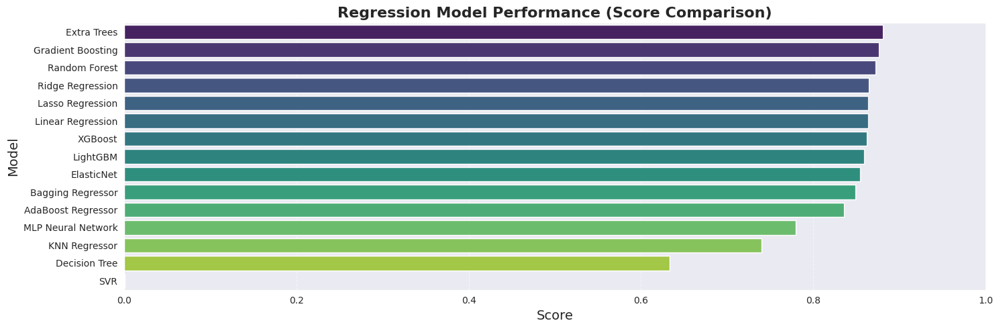

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ===============================================
# DATA
# ===============================================
X = df.drop("SalePrice", axis=1)
y = df["SalePrice"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# ===============================================
# SCALER for models that need scaling
# ===============================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ===============================================
# TRY IMPORT ADVANCED MODELS
# ===============================================
advanced_models = {}

try:
    from xgboost import XGBRegressor
    advanced_models["XGBoost"] = XGBRegressor(
        objective="reg:squarederror",
        eval_metric="rmse",
        learning_rate=0.05,
        max_depth=6,
        n_estimators=500,
        subsample=0.8,
        colsample_bytree=0.8,
    )
except:
    pass

try:
    from lightgbm import LGBMRegressor
    advanced_models["LightGBM"] = LGBMRegressor(
        learning_rate=0.05,
        n_estimators=500
    )
except:
    pass

try:
    from catboost import CatBoostRegressor
    advanced_models["CatBoost"] = CatBoostRegressor(
        verbose=False,
        depth=8,
        learning_rate=0.05,
        iterations=500
    )
except:
    pass


# ===============================================
# BASIC REGRESSION MODELS
# ===============================================
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (
    RandomForestRegressor, GradientBoostingRegressor,
    AdaBoostRegressor, ExtraTreesRegressor, BaggingRegressor
)
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor

models = {
    # Linear Models
    "Linear Regression": (LinearRegression(), True),
    "Ridge Regression": (Ridge(), True),
    "Lasso Regression": (Lasso(), True),
    "ElasticNet": (ElasticNet(), True),

    # Tree & Ensemble Models
    "Decision Tree": (DecisionTreeRegressor(), False),
    "Random Forest": (RandomForestRegressor(), False),
    "Extra Trees": (ExtraTreesRegressor(), False),
    "Gradient Boosting": (GradientBoostingRegressor(), False),
    "AdaBoost Regressor": (AdaBoostRegressor(), False),
    "Bagging Regressor": (BaggingRegressor(), False),

    # Distance & Neural Models
    "KNN Regressor": (KNeighborsRegressor(n_neighbors=5, weights="distance"), True),
    "SVR": (SVR(), True),
    "MLP Neural Network": (MLPRegressor(hidden_layer_sizes=(128, 64), max_iter=3000), True)
}

# Add advanced models (skip scaling)
for name, model in advanced_models.items():
    models[name] = (model, False)


# ===============================================
# RUN ALL MODELS (SAFE MODE)
# ===============================================
scores = {}

print("\n==================== MODEL PERFORMANCE (SIMPLE SCORE) ====================\n")

for name, (model, need_scaling) in models.items():
    try:
        if need_scaling:
            model.fit(X_train_scaled, y_train)
            score = model.score(X_test_scaled, y_test)
        else:
            model.fit(X_train, y_train)
            score = model.score(X_test, y_test)

        scores[name] = score
        print(f"{name}: Score = {score:.4f}")

    except Exception as e:
        print(f"{name}:  Skipped (Error)")


# ===============================================
# SORT MODELS BY SCORE
# ===============================================
sorted_scores = sorted(scores.items(), key=lambda x: x[1], reverse=True)

print("\n==================== SORTED SCORE (DESC) ====================")
for model, score in sorted_scores:
    print(f"{model}: {score:.4f}")

best_model = sorted_scores[0]
print("\n BEST MODEL =", best_model[0])
print(" Score =", round(best_model[1], 4))


# ===============================================
# MODEL ACCURACY PLOT
# ===============================================
plot_df = pd.DataFrame(sorted_scores, columns=["Model", "Score"])

plt.figure(figsize=(15, 5))
sns.barplot(data=plot_df, x="Score", y="Model", palette="viridis")

plt.title("Regression Model Performance (Score Comparison)", fontsize=16, fontweight='bold')
plt.xlabel("Score", fontsize=14)
plt.ylabel("Model", fontsize=14)
plt.xlim(0, 1)
plt.grid(axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


# XGBRegressor Model

In [ ]:
from xgboost import XGBRegressor

# Features and target
X = df.drop("SalePrice", axis=1)
y = df["SalePrice"]

# Train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Create simple XGBoost model
model = XGBRegressor(eval_metric="rmse")

# Train
model.fit(X_train, y_train)

# Predict
pred = model.predict(X_test)

# Simple score (R² score)
score = model.score(X_test, y_test)

print(f"XGBoost Score: {round(score*100, 4)}%")


XGBoost Score: 84.2233%


In [ ]:
# 90.9891